In [1]:
import numpy as np
import xarray as xr 
import matplotlib.pyplot as plt
import pickle
import sys 

sys.path.append('../util/')

import WheelerKaladis_util as wk

%load_ext autoreload
%autoreload 2

In [2]:
# Load the dictionary from the file
vn = 'olr'
lat_lim = 20
mjo_ind = 'RMM' 
leadmjo = 15
m=1
mflg = 'off' 
wnx = 1
wnxflg = 'off'
zmode = 1
nmem = 1
dataflg = '' 
flag = vn+str(lat_lim)+'deg_'+mjo_ind+'_ERA5_lead'+str(leadmjo)+'_dailyinput_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_zmode'+str(zmode)+'_nmem'+str(nmem)+dataflg

with open('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus_new/hidden_analysis/outfields'+vn+str(lat_lim)+'deg_'+mjo_ind+'_ERA5_lead'+str(leadmjo)+'_dailyinput_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_zmode'+str(zmode)+'_nmem'+str(nmem)+'.pickle', 'rb') as file2:
    outfields = pickle.load(file2)

# ds0 = xr.open_dataset('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus_new/hidden_analysis/input_'+flag+'.nc')
# ds1 = xr.open_dataset('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus_new/hidden_analysis/hid1_'+flag+'.nc')
# ds5 = xr.open_dataset('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus_new/hidden_analysis/hid5_'+flag+'.nc')


In [8]:
np.shape(np.asarray(outfields['hidden1'])[:10, :, 1, :, :])

(10, 20, 21, 180)

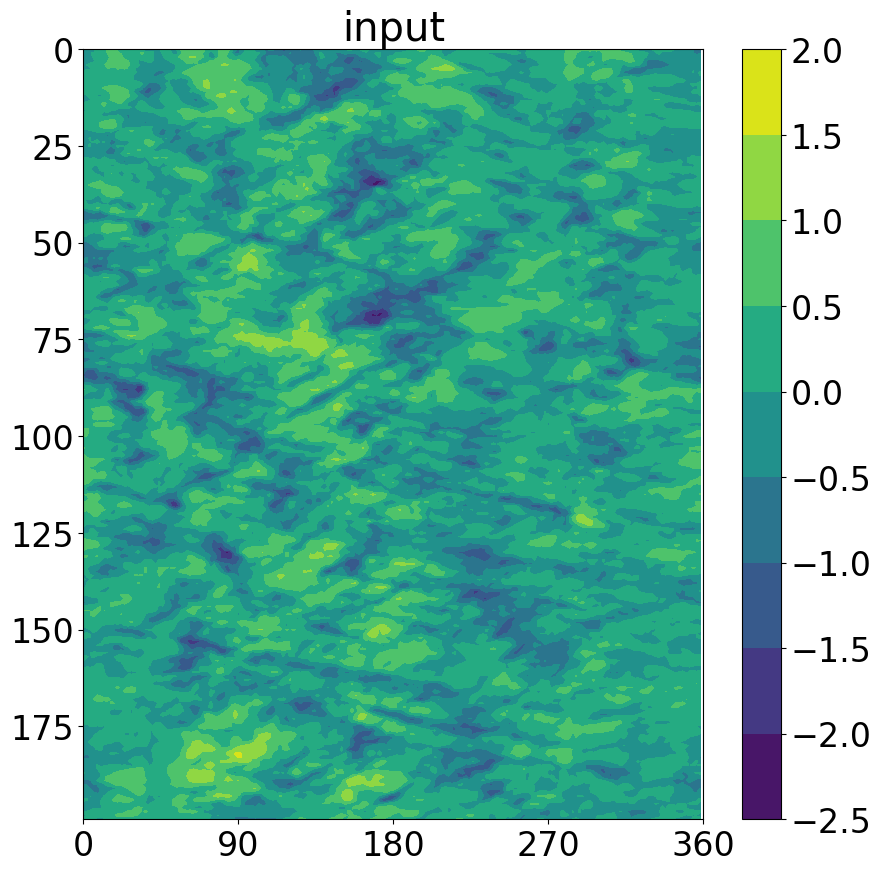

In [19]:
tstep = 0
fltnum = 0
hid1 = np.mean(np.reshape(np.asarray(outfields['input_map'])[:10, :, fltnum, :, :], (-1, 21, 180)), axis=-2).squeeze()
plt.rcParams.update({'font.size': 24})
plt.figure(figsize=(10,10))
# im = plt.pcolormesh(np.arange(0,360,2), np.arange(-20,22,2), hid1)
im = plt.contourf(np.arange(0,360,2), np.arange(0,200), hid1)
plt.colorbar(im)

plt.xticks([0,90,180,270,360])
plt.title(f'input')
# reverse the y axis
plt.gca().invert_yaxis()

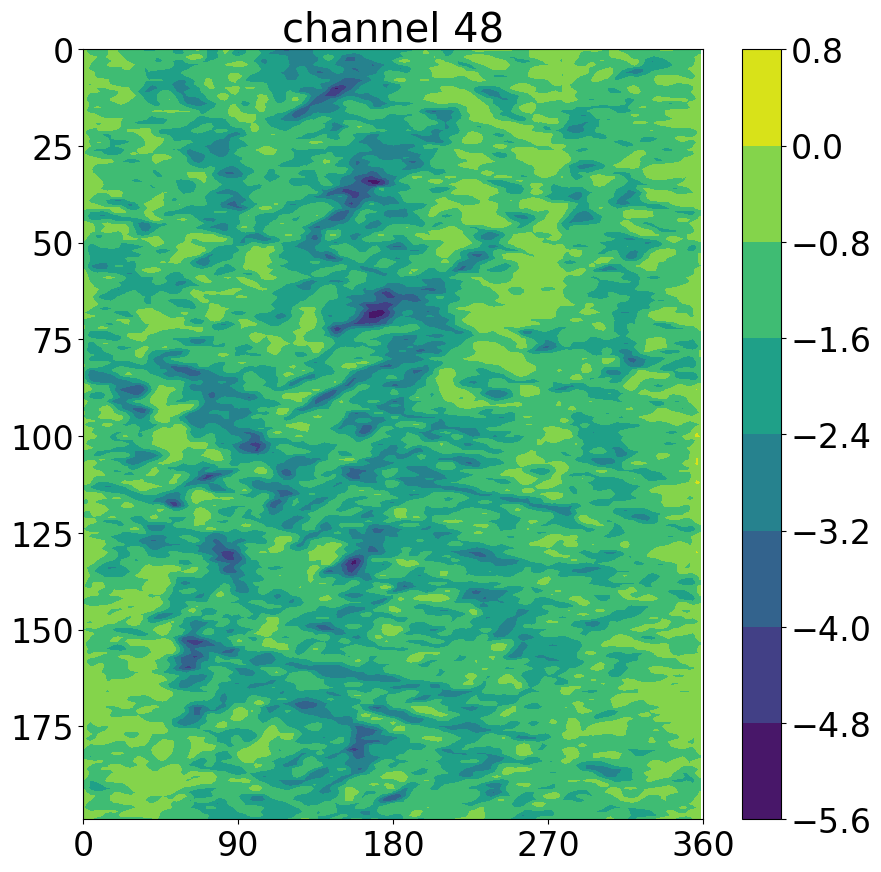

In [17]:
tstep = 0
fltnum = 47
hid1 = np.mean(np.reshape(np.asarray(outfields['hidden1'])[:10, :, fltnum, :, :], (-1, 21, 180)), axis=-2).squeeze()
plt.rcParams.update({'font.size': 24})
plt.figure(figsize=(10,10))
# im = plt.pcolormesh(np.arange(0,360,2), np.arange(-20,22,2), hid1)
im = plt.contourf(np.arange(0,360,2), np.arange(0,200), hid1)
plt.colorbar(im)

plt.xticks([0,90,180,270,360])
plt.title(f'channel {fltnum+1}')
# reverse the y axis
plt.gca().invert_yaxis()

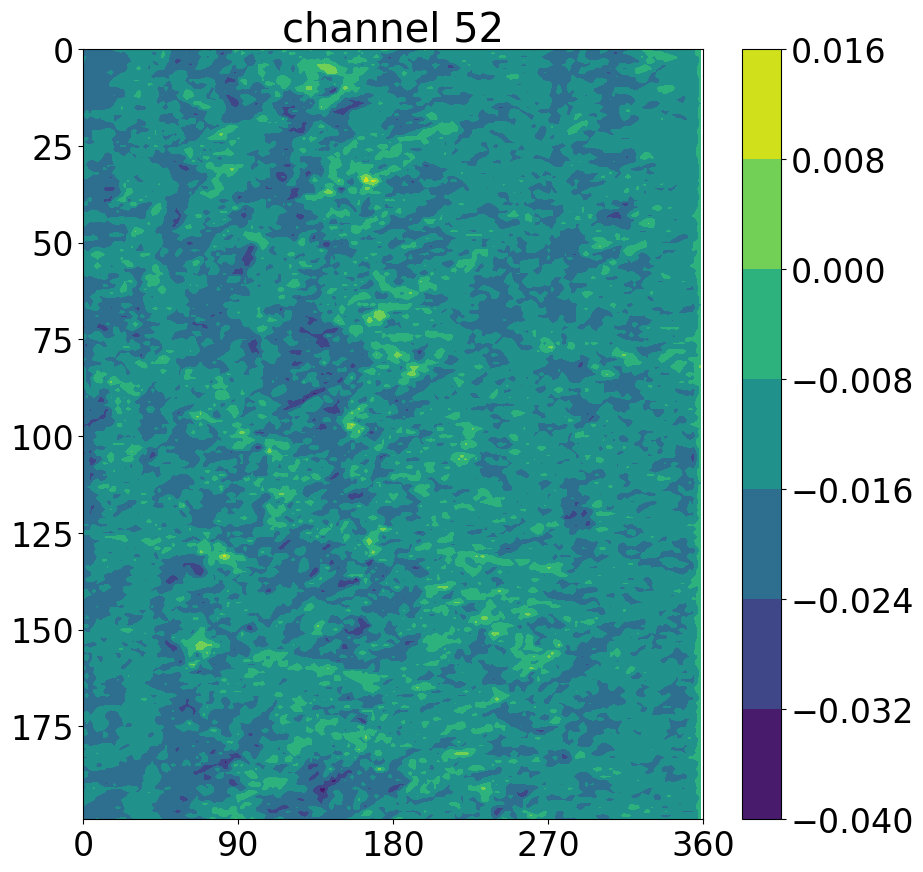

In [26]:
tstep = 0
fltnum = 51
hid1 = np.mean(np.reshape(np.asarray(outfields['hidden5'])[:10, :, fltnum, :, :], (-1, 21, 180)), axis=-2).squeeze()
plt.rcParams.update({'font.size': 24})
plt.figure(figsize=(10,10))
# im = plt.pcolormesh(np.arange(0,360,2), np.arange(-20,22,2), hid1)
im = plt.contourf(np.arange(0,360,2), np.arange(0,200), hid1)
plt.colorbar(im)

plt.xticks([0,90,180,270,360])
plt.title(f'channel {fltnum+1}')
# reverse the y axis
plt.gca().invert_yaxis()

Text(0.5, 1.0, 'channel 52')

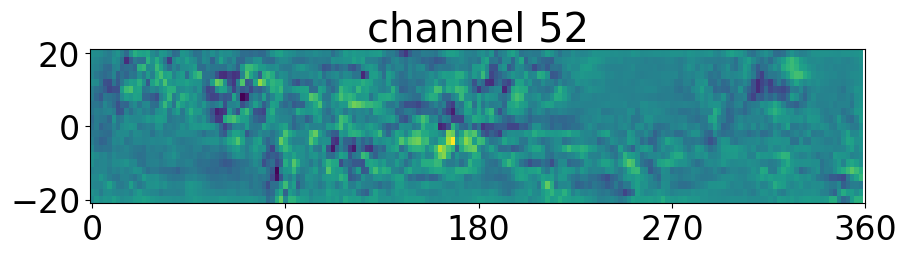

In [25]:
tstep = 0
fltnum = 51
hid1 = np.asarray(outfields['hidden5'])[tstep, tstep, fltnum, :, :].squeeze()
plt.rcParams.update({'font.size': 24})
plt.figure(figsize=(10,2))
im = plt.pcolormesh(np.arange(0,360,2), np.arange(-20,22,2), hid1)
# plt.colorbar(im)

plt.xticks([0,90,180,270,360])
plt.title(f'channel {fltnum+1}')

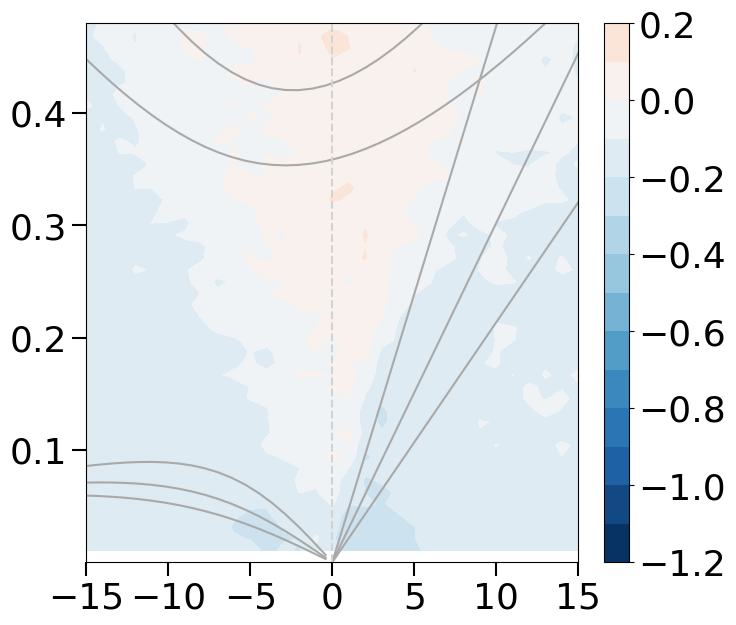

In [4]:
data = ds1['sm_sym'].mean('channel') / ds0['sm_sym'].sel(channel=0)
wk.wk_plot_sym(data, cmapflg='RdBu_r', center0=True)

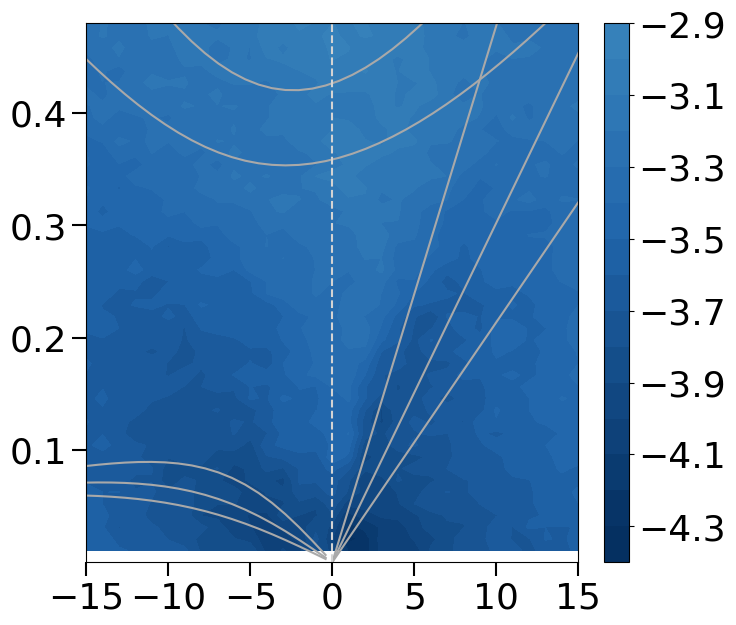

In [5]:
data = ds5['sm_sym'].mean('channel') / ds0['sm_sym'].sel(channel=0)
wk.wk_plot_sym(data, cmapflg='RdBu_r', center0=True)

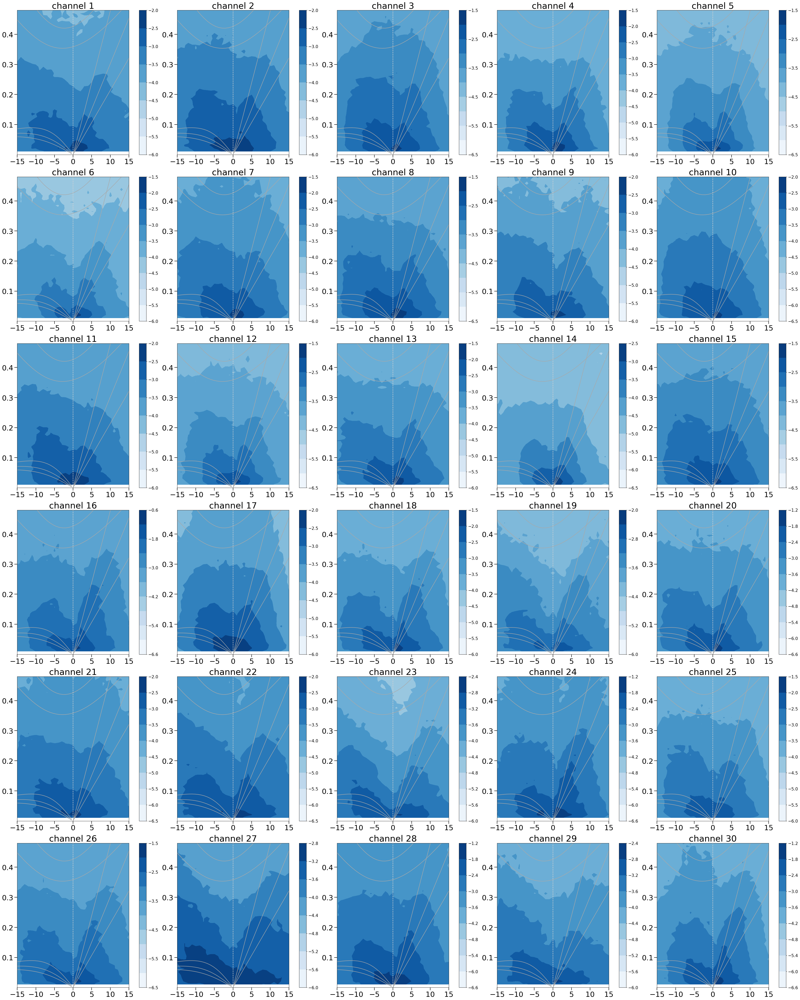

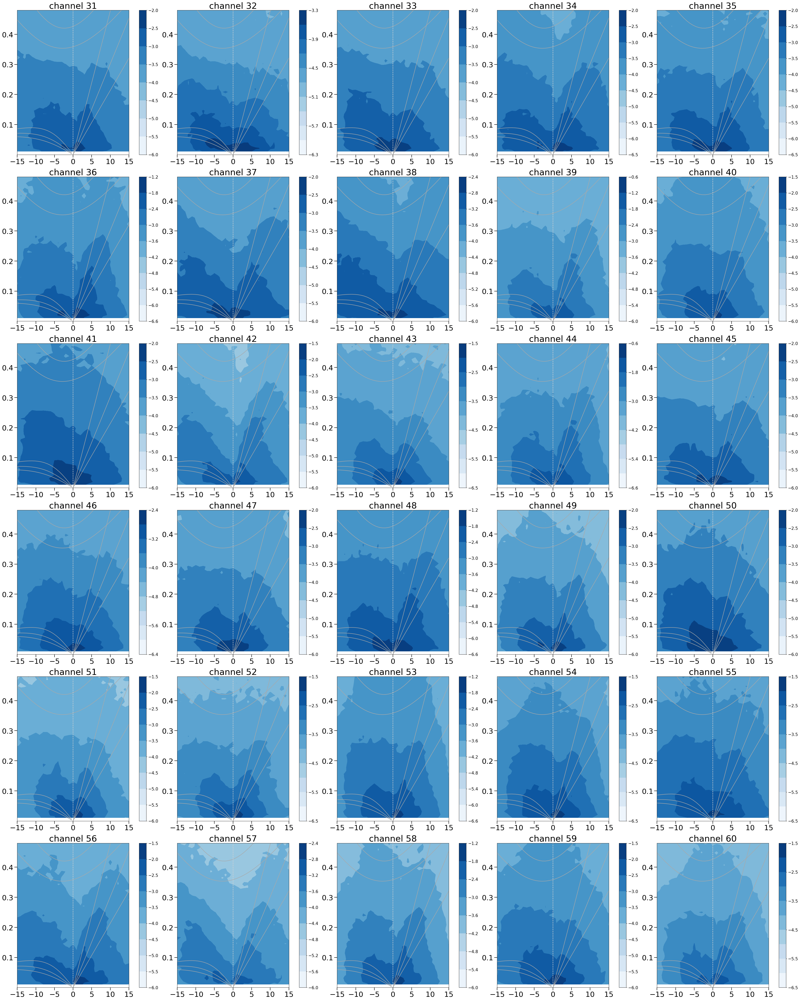

In [20]:
# Create the figure with a grid of subplots
fig, axs = plt.subplots(6, 5, figsize=(40, 50), constrained_layout=True)

# Plot each subplot
for i, ax in enumerate(axs.flat):
    sym = ds1['sm_sym'].sel(channel=i)
    wk.wk_plot_sym_hid_one(ax, sym, tlt=f'channel {i+1}', logflg=True)

plt.show()

# Create the figure with a grid of subplots
fig, axs = plt.subplots(6, 5, figsize=(40, 50), constrained_layout=True)

# Plot each subplot
for i, ax in enumerate(axs.flat):
    sym = ds1['sm_sym'].sel(channel=i+30)
    wk.wk_plot_sym_hid_one(ax, sym, tlt=f'channel {i+31}', logflg=True)

plt.show()

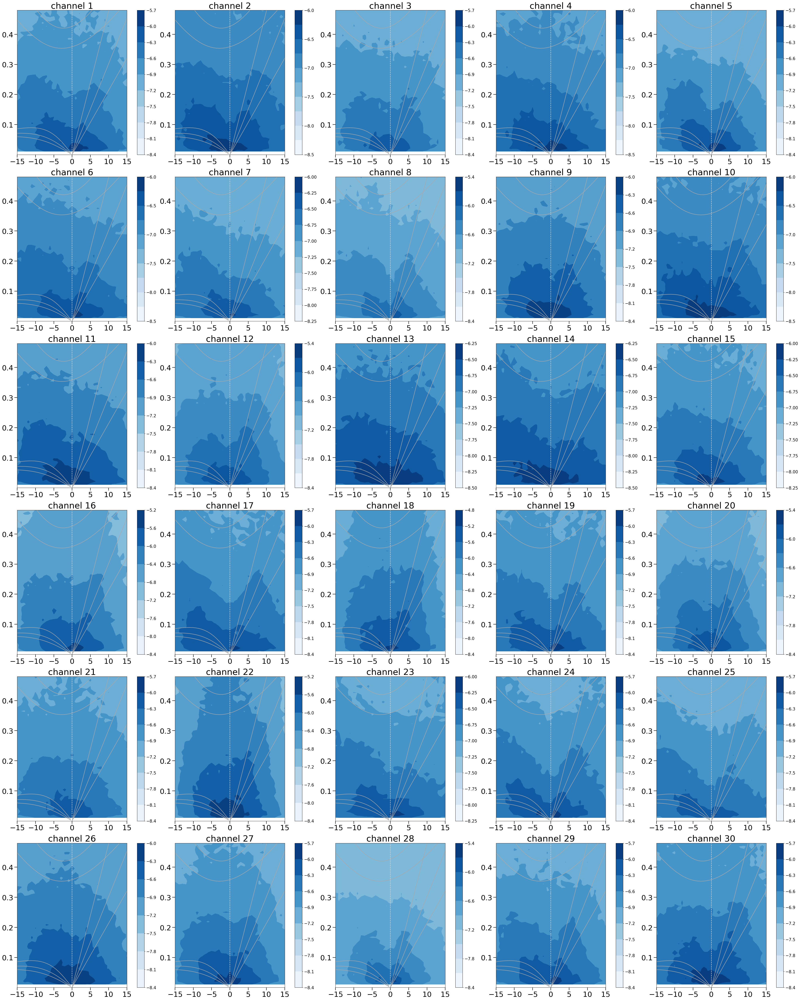

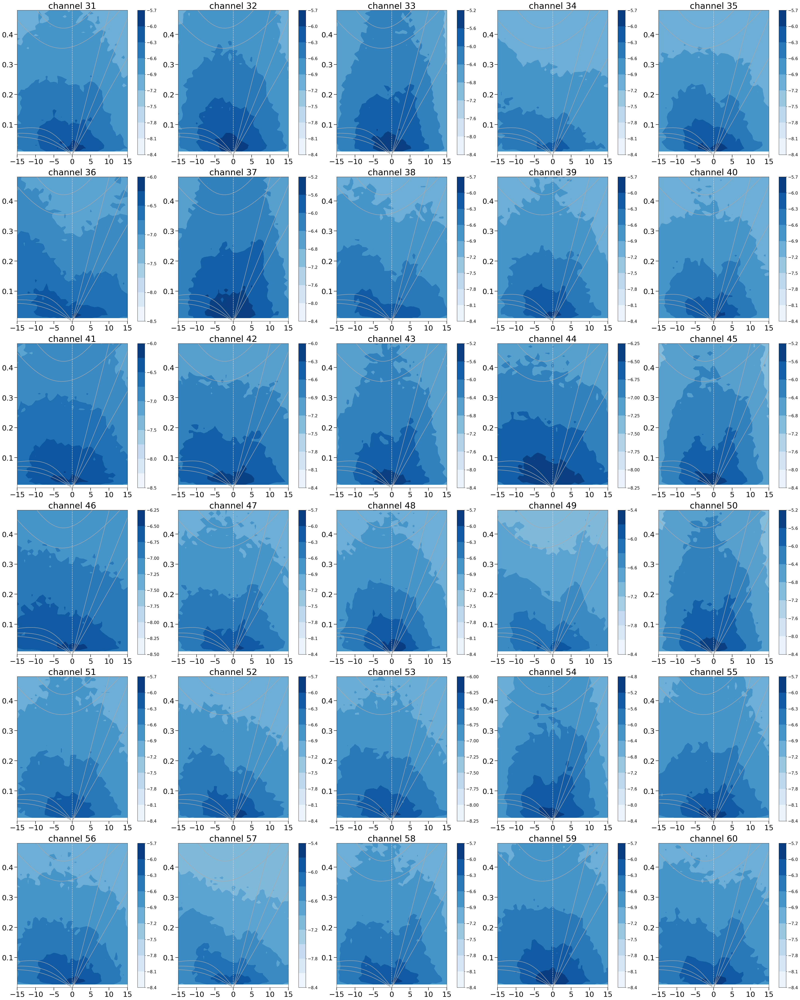

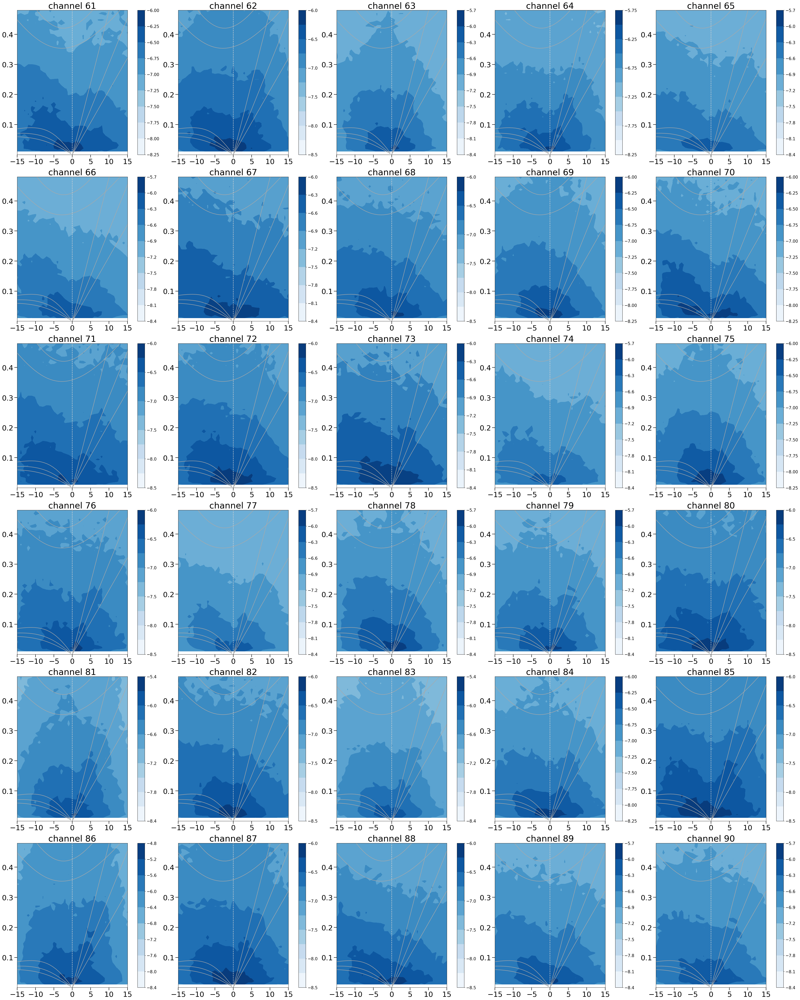

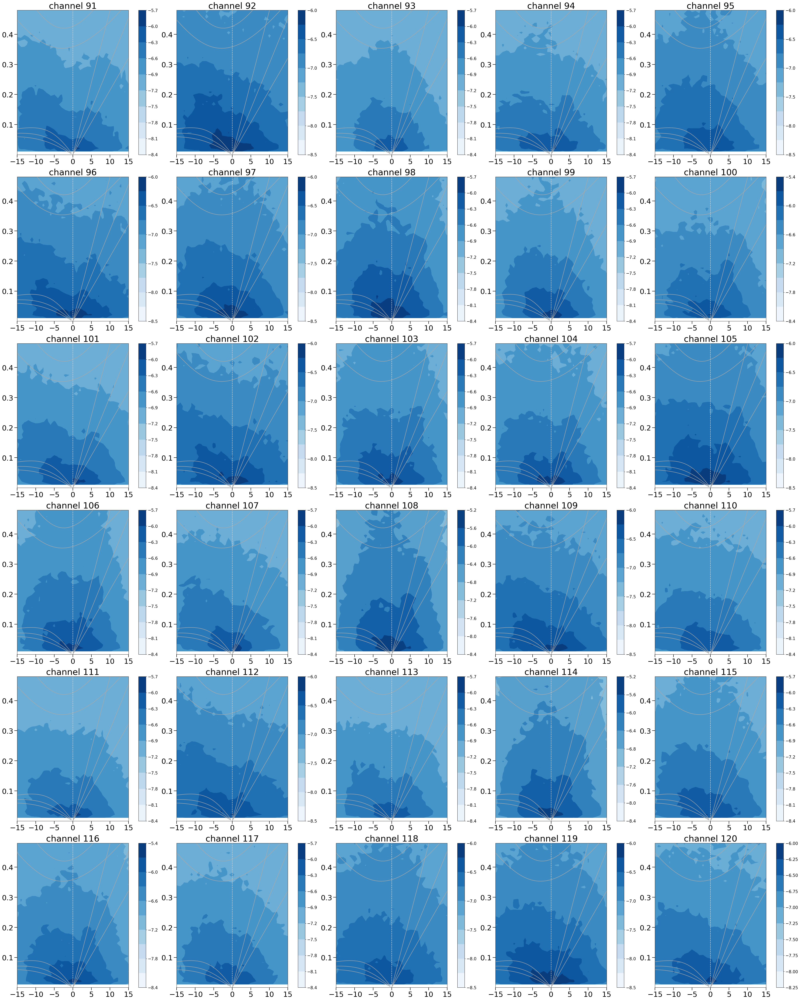

In [21]:
# Create the figure with a grid of subplots
fig, axs = plt.subplots(6, 5, figsize=(40, 50), constrained_layout=True)

# Plot each subplot
for i, ax in enumerate(axs.flat):
    sym = ds5['sm_sym'].sel(channel=i)
    wk.wk_plot_sym_hid_one(ax, sym, tlt=f'channel {i+1}', logflg=True)

plt.show()
# Create the figure with a grid of subplots
fig, axs = plt.subplots(6, 5, figsize=(40, 50), constrained_layout=True)

# Plot each subplot
for i, ax in enumerate(axs.flat):
    sym = ds5['sm_sym'].sel(channel=i+30)
    wk.wk_plot_sym_hid_one(ax, sym, tlt=f'channel {i+31}', logflg=True)

plt.show()
# Create the figure with a grid of subplots
fig, axs = plt.subplots(6, 5, figsize=(40, 50), constrained_layout=True)

# Plot each subplot
for i, ax in enumerate(axs.flat):
    sym = ds5['sm_sym'].sel(channel=i+60)
    wk.wk_plot_sym_hid_one(ax, sym, tlt=f'channel {i+61}', logflg=True)

plt.show()
# Create the figure with a grid of subplots
fig, axs = plt.subplots(6, 5, figsize=(40, 50), constrained_layout=True)

# Plot each subplot
for i, ax in enumerate(axs.flat):
    sym = ds5['sm_sym'].sel(channel=i+90)
    wk.wk_plot_sym_hid_one(ax, sym, tlt=f'channel {i+91}', logflg=True)

plt.show()

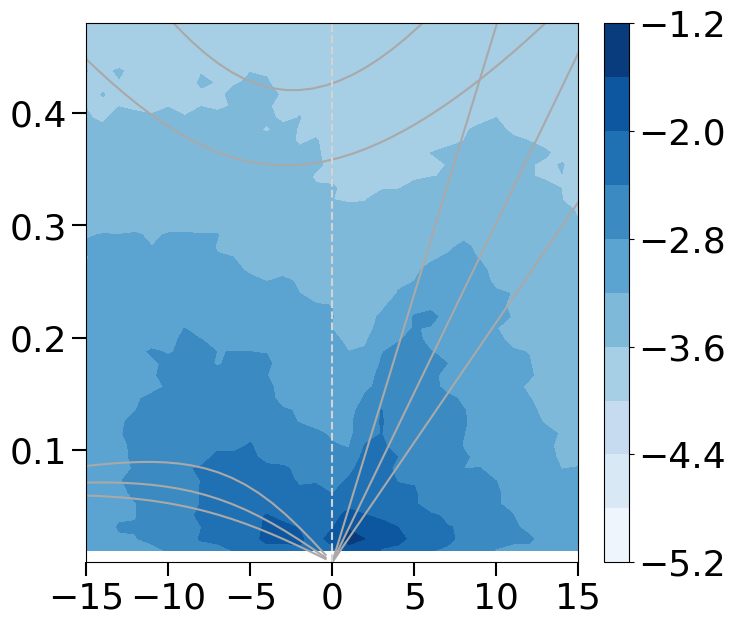

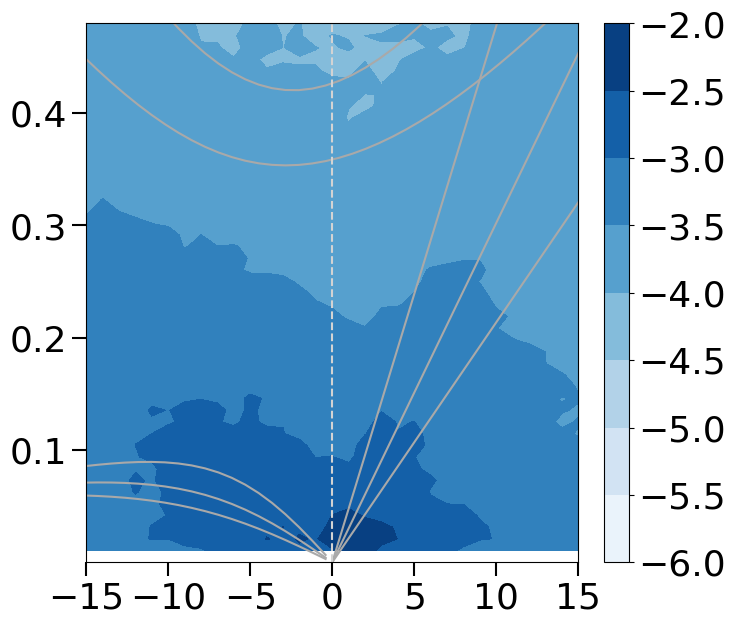

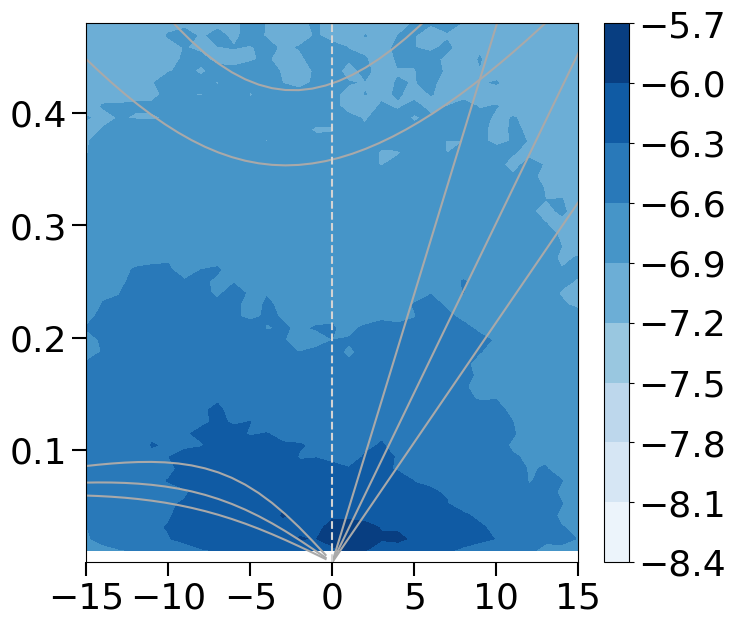

In [13]:
wk.wk_plot_sym(ds0['sm_sym'].sel(channel=0))
wk.wk_plot_sym(ds1['sm_sym'].sel(channel=0))
wk.wk_plot_sym(ds5['sm_sym'].sel(channel=0))

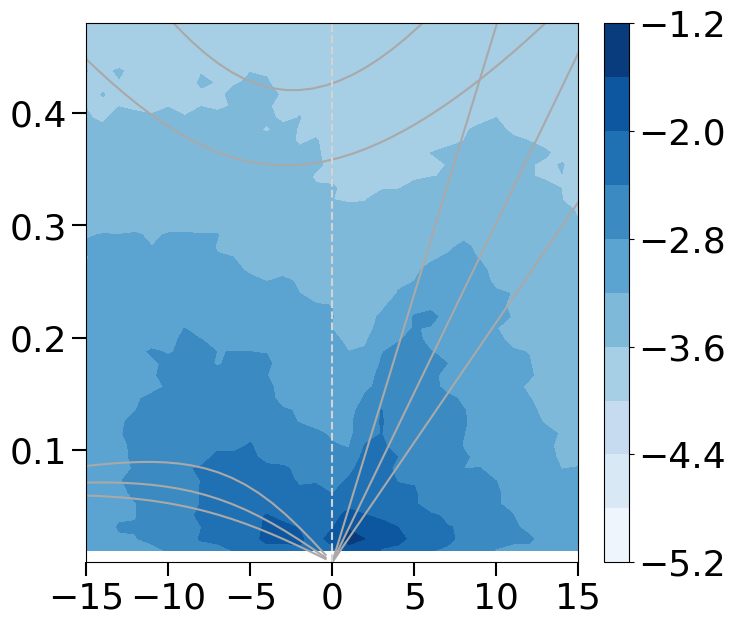

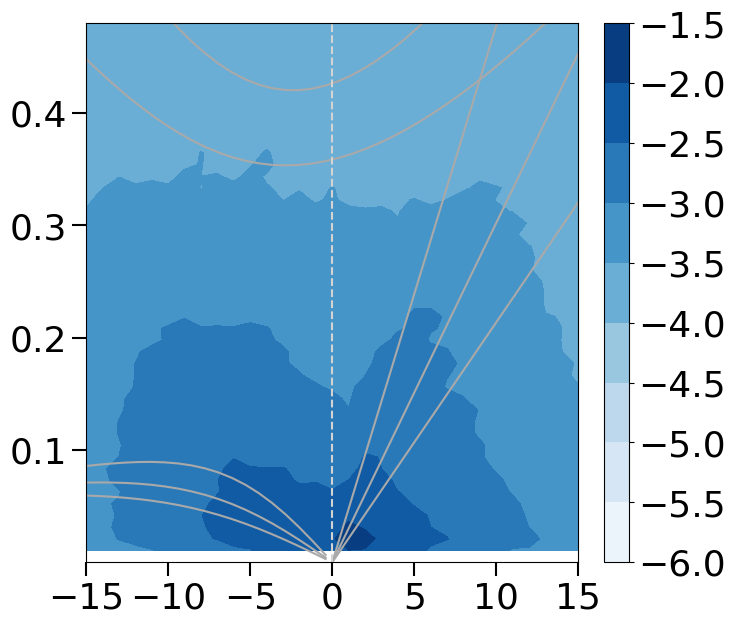

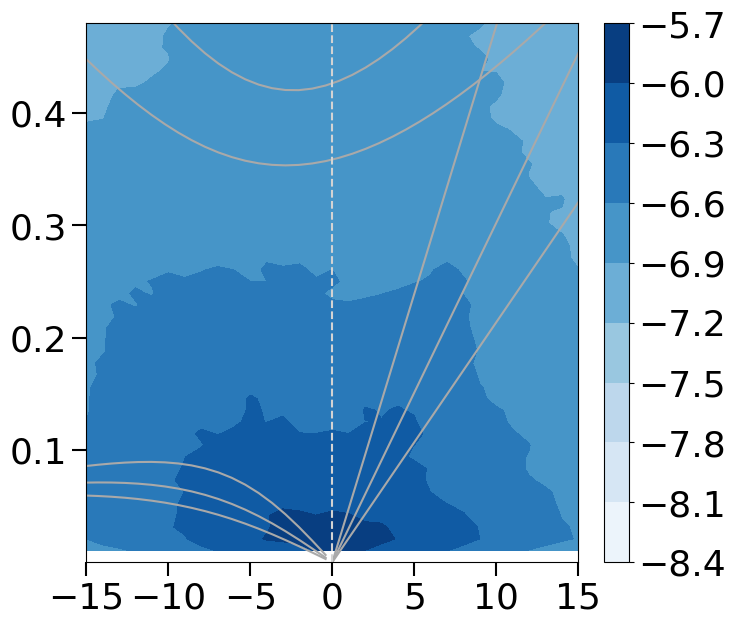

In [10]:
wk.wk_plot_sym(ds0['sm_sym'].sel(channel=0))
wk.wk_plot_sym(ds1['sm_sym'].mean('channel'))
wk.wk_plot_sym(ds5['sm_sym'].mean('channel'))

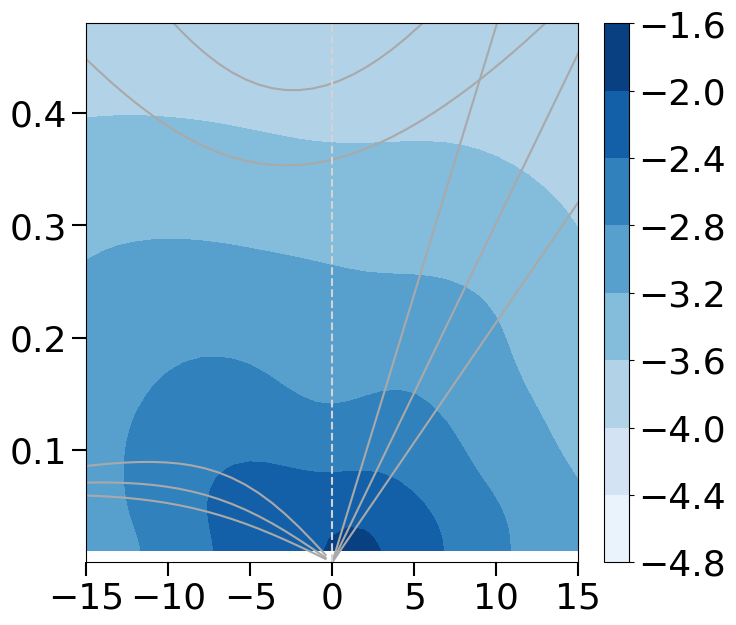

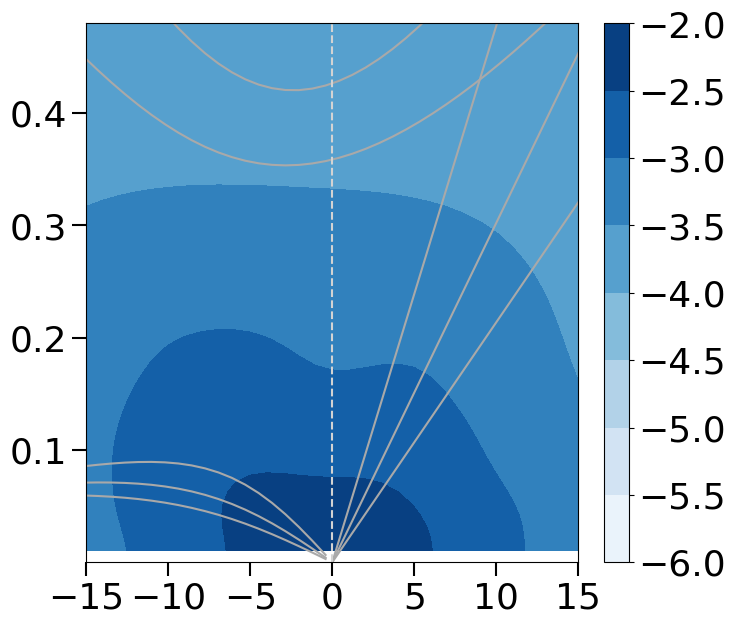

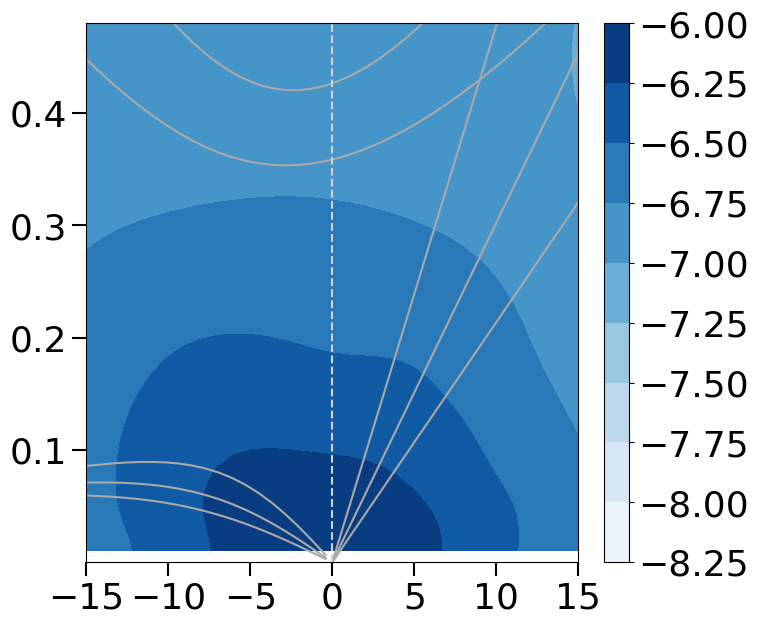

In [12]:
wk.wk_plot_sym(ds0['background'].sel(channel=0))
wk.wk_plot_sym(ds1['background'].mean('channel'))
wk.wk_plot_sym(ds5['background'].mean('channel'))

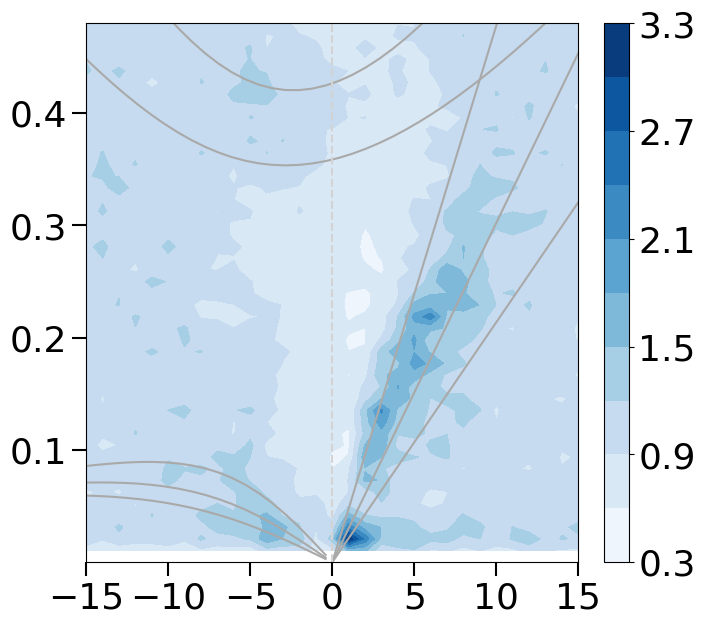

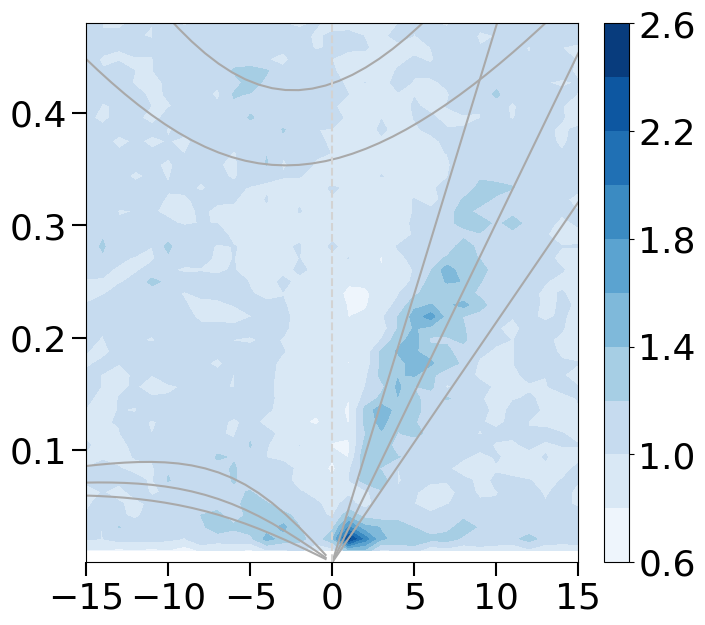

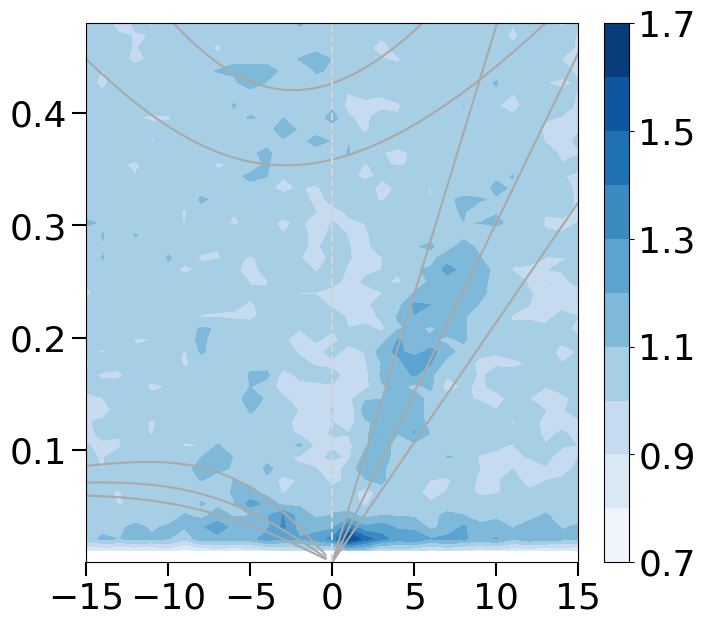

In [11]:
wk.wk_plot_sym(ds0['sym_norm'].sel(channel=0), logflg=False)
wk.wk_plot_sym(ds1['sym_norm'].mean('channel'), logflg=False)
wk.wk_plot_sym(ds5['sym_norm'].mean('channel'), logflg=False)

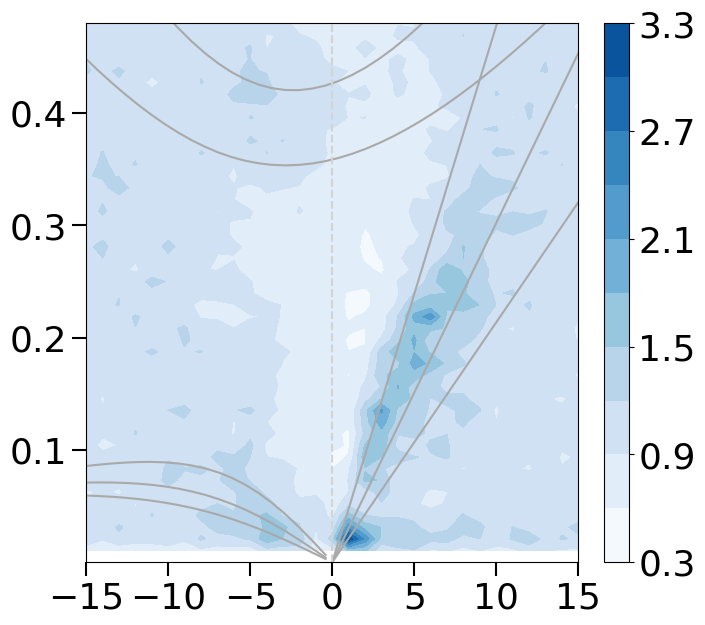

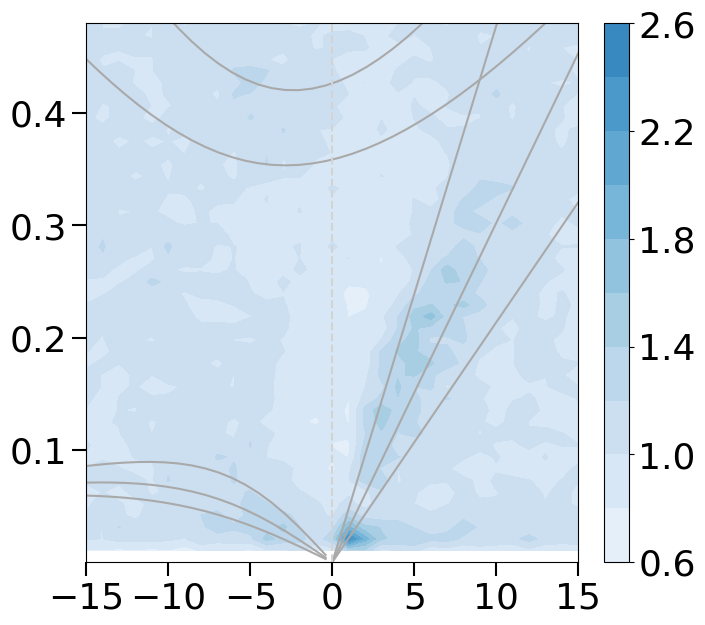

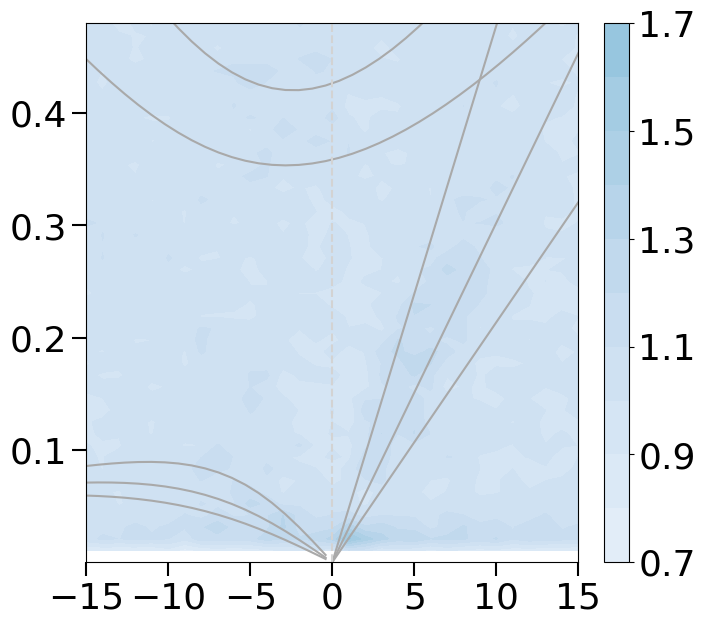

In [7]:
wk.wk_plot_sym(ds0['sym_norm'].sel(channel=0), logflg=False, setcolor=True, vmin=0.4, vmax=3.6)
wk.wk_plot_sym(ds1['sym_norm'].mean('channel'), logflg=False, setcolor=True, vmin=0.4, vmax=3.6)
wk.wk_plot_sym(ds5['sym_norm'].mean('channel'), logflg=False, setcolor=True, vmin=0.4, vmax=3.6)


In [2]:
# Load the dictionary from the file
vn = 'olr'
lat_lim = 20
mjo_ind = 'RMM' 
leadmjo = 15
m=1
mflg = 'off' 
wnx = 1
wnxflg = 'off'
zmode = 1
nmem = 1
dataflg = '' 
with open('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus_new/hidden_analysis/outfields'+vn+str(lat_lim)+'deg_'+mjo_ind+'_ERA5_lead'+str(leadmjo)+'_dailyinput_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_zmode'+str(zmode)+'_nmem'+str(nmem)+dataflg+'.pickle', 'rb') as file1:
    outfields = pickle.load(file1)
    

In [3]:
# get the time dimension 
# /pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus_new/output/predicted_MCDO_UNET_olr20deg_RMMERA5_1modesoff_wnx0one_lead0_dailyinput_1979to2015_c51_mem1d.nc
fntime = '/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus_new/output/predicted_MCDO_UNET_'+vn+str(lat_lim)+'deg_'+mjo_ind+'ERA5_'+str(m)+'modes'+mflg+'_wnx'+str(wnx)+wnxflg+'_lead'+str(leadmjo)+'_dailyinput_1979to2015_c51_mem'+str(nmem)+'d.nc' 
time = xr.open_dataset(fntime)['time']

In [4]:
outfields.keys()

dict_keys(['input_map', 'input_layer', 'hidden1', 'hidden2', 'hidden3', 'hidden4', 'hidden5'])

In [ ]:
feature_map = np.asarray(outfields['input_map'])
feature_map.shape

In [6]:
feature_map_hid5_001 = feature_map[:,:,0,:,:].squeeze()
old_shape = feature_map_hid5_001.shape
new_shape = [old_shape[0]*old_shape[1], old_shape[2], old_shape[3]]

hid5_001 = feature_map_hid5_001.reshape(new_shape)

In [7]:
hid5_001.shape

(2540, 21, 180)

In [8]:
del outfields, feature_map

In [9]:
hid5_001_da = xr.DataArray(
    hid5_001,
    dims=['time','lat','lon'],
    coords={
        'time': time,
        'lat': np.arange(20,-22,-2),
        'lon': np.arange(0,360,2)
    }
)

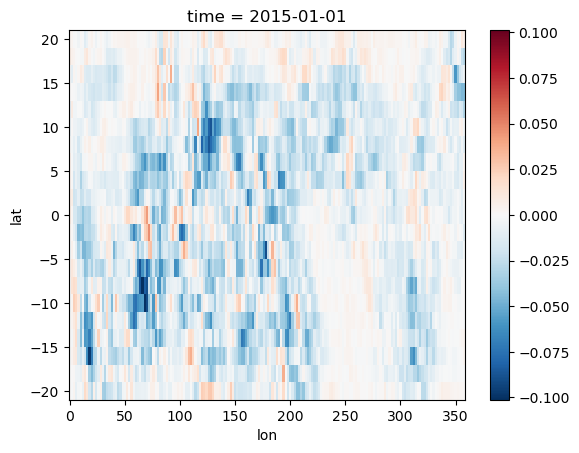

In [10]:
hid5_001_da.sel(time='2015-01-01').plot()

In [11]:
sym, asym, sym_segs, asym_segs = wk.spacetime_power(hid5_001_da, sigtest=True)

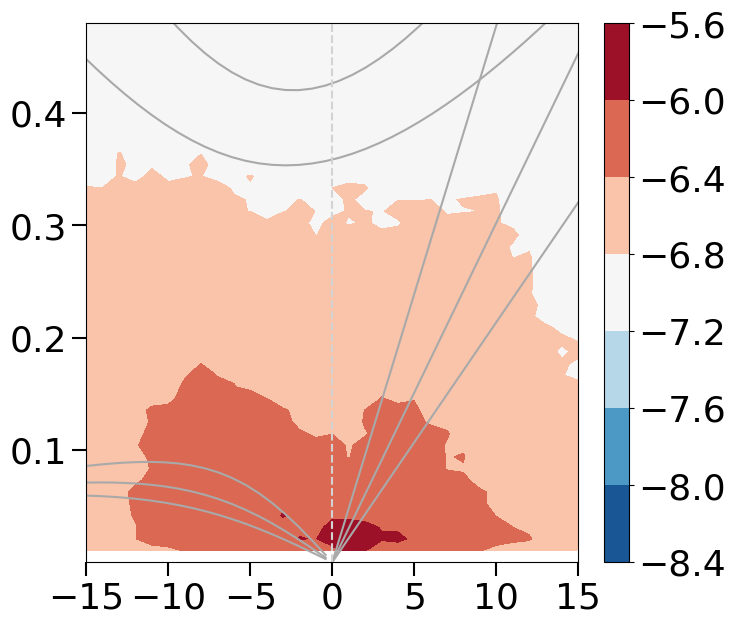

In [12]:
wk.wk_plot_sym(sym)

In [13]:
sm_sym, sm_asym, background, sym_norm, asym_norm, sym_norm_sig, asym_norm_sig = wk.wk_analysis(hid5_001_da, sigtest=True)

(68, 179, 47)
(179, 47)


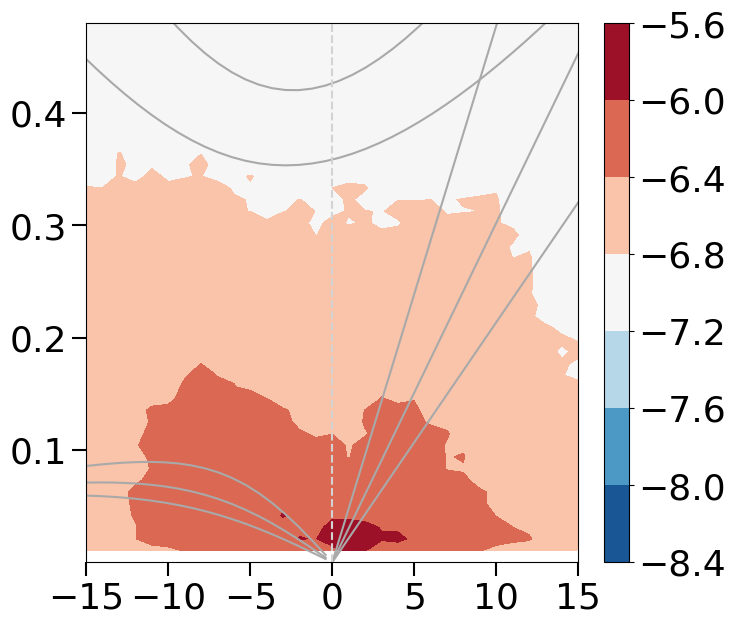

In [16]:
wk.wk_plot_sym(sm_sym)

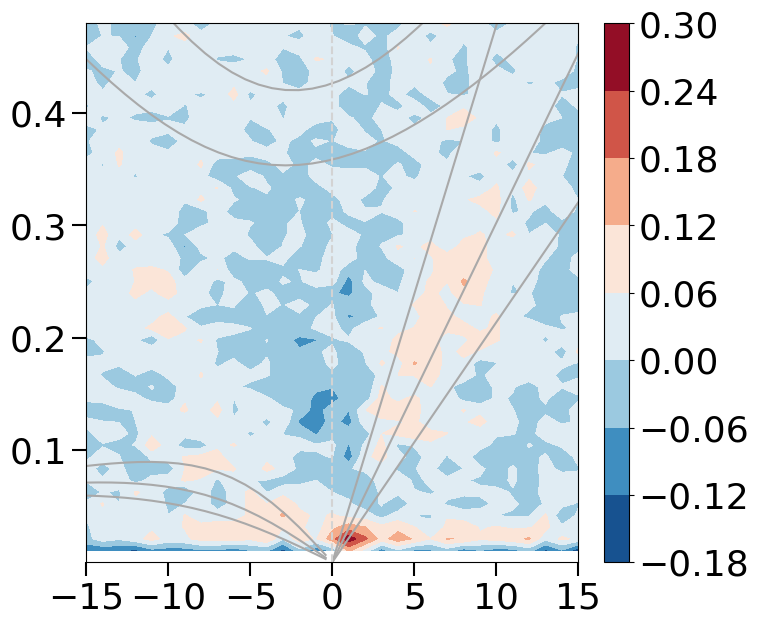

In [14]:
wk.wk_plot_sym(sym_norm)

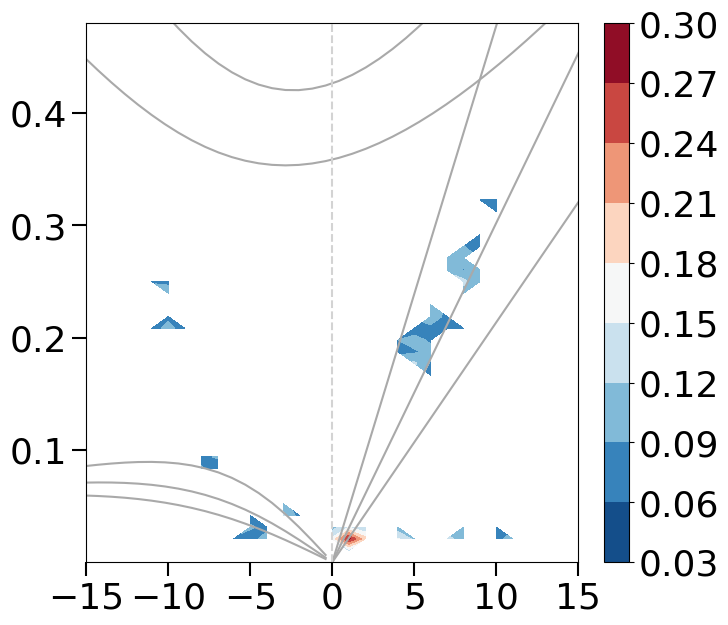

In [15]:
wk.wk_plot_sym(sym_norm_sig)